**Performance Assessment 2** 

**D213 – Advanced Data Analytics** 

Jessica Hosey  

MSDA, College of Information Technology  

Western Governors University  

January 19th, 2025

**Part I: Research Question**

**A. 1. Summarize one research question that you will answer using neural network models and NLP techniques. Be sure the research question is relevant to a real-world organizational situation and sentiment analysis captured in your chosen data set(s).** 

How accurately can neural network models predict whether a reviewer would recommend a product based solely on the sentiment and content of their review?  

The datasets contain text reviews and labels' 0' and '1', indicating an overall positive or negative review. No neutral responses are included in the dataset. If the reviewer seems positive about the product/experience, they would most likely recommend it to another person. If their review/experience were negative, they would likely not recommend the product to another person. We can use information from a neural network and NLP techniques to generally predict whether a customer would recommend (or not recommend) the product based on the type of words they use in their review.     

**A. 2. Define the objectives or goals of the data analysis. Be sure the objectives or goals are reasonable within the scope of the research question and are represented in the available data.**

Build a predictive model using NLP techniques to predict whether a reviewer would recommend a product (labeled '1') or not (labeled '0') based on the sentiment and text of their review. 

Understand key predictive features by analyzing the text to identify words, phrases, or patterns that contribute most to the model's predictions. 

Evaluate the model and assess its accuracy in predicting recommendations using precision, recall, a f-1 score, and accuracy to ensure the results are reliable and meaningful to the project's goals.   

Translate the model's outputs into insights/trends that the business can use to address product concerns to increase the likelihood of recommending products to another potential customer.   

**A. 3. Identify a type of neural network capable of performing a text classification task that can be trained to produce useful predictions on text sequences on the selected data set.** 

The neural network used for this classification task is a Long Short-Term Memory (LSTM) network known as Recurrent Neural Network (RNN).  

**Part II: Data Preparation**

**B. 1. Perform exploratory data analysis on the chosen data set and include an explanation of each of the following elements: the presence of unusual characters, vocabulary size, proposed word embedding length, and statistical justification for the chosen maximum sequence length.** 

The first step is to concat all three datasets into one large data frame. Then, look at the data available to see if there are any problems with column titles, structure of the tables, etc. Once everything looks okay, we will ensure no null or empty cells are in the table. If there is, we will deal with them appropriately. 

The second step is to prepare our reviews for neural network modeling and NLP techniques. Before we build the neural network model, we need to adjust the reviews and labels in the table. We used regex to distinguish between English and non-English characters and remove unusual characters. This will separate the non-English characters from the English ones and remove them. After this, we separated the label column by '1' and '0' responses. Then, we need to get word counts and vocabulary size using value_counts(). Our vocabulary size in this combined data frame is 4,967 words. The next step was to see the most frequent words in the dataset and how many times they were used in sentiments (see first screenshot below). This led to looking into specific words that were always labeled with a positive sentiment (csat) and words always labeled with a negative sentiment (dsat).

Next, we looked at what words were typically used together in the form of bigrams and trigrams. Below are the screenshots for popular bigrams and trigrams found within the dataset.

We then found the max sequence embedding of 8, a sequence length of 789, and the mean, minimum, and median sequence lengths of 7, 1, and 5, respectively. 

In [3]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
from pandas import Series, DataFrame
import numpy as np
import datetime
import re
import unicodedata
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/1e94418b-06f2-49e1-b359-
[nltk_data]     371021f069c4/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/1e94418b-06f2-49e1-b359-
[nltk_data]     371021f069c4/nltk_data...
2025-01-23 17:08:17.553153: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-23 17:08:18.222493: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-23 17:08:18.599995: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737652099.108651     145 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 

In [9]:
#loading txt files and read
colnames=['text', 'label'] 
df_amzn = pd.read_csv('./amazon_cells_labelled.txt', sep='\t', names=colnames, header=None)
df_imdb = pd.read_csv('./imdb_labelled.txt', sep='\t', names=colnames, header=None)
df_yelp = pd.read_csv('./yelp_labelled.txt', sep='\t', names=colnames, header=None)
df = pd.concat([df_amzn, df_imdb, df_yelp])
df = df.reset_index(drop=True)

In [11]:
df.shape

(2748, 2)

In [13]:
df.head()
df.tail()

,text,label
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0
4,The mic is great.,1


,text,label
2743,I think food should have flavor and texture and both were lacking.,0
2744,Appetite instantly gone.,0
2745,Overall I was not impressed and would not go back.,0
2746,"The whole experience was underwhelming, and I think we'll just go to Ninja Sushi next time.",0
2747,"Then, as if I hadn't wasted enough of my life there, they poured salt in the wound by drawing out the time it took to bring the check.",0


In [16]:
df.isnull().sum()

text     0
label    0
dtype: int64

In [18]:
df['text'] = df['text'].str.lower()

In [20]:
df.head()
df.tail()

,text,label
0,so there is no way for me to plug it in here in the us unless i go by a converter.,0
1,"good case, excellent value.",1
2,great for the jawbone.,1
3,tied to charger for conversations lasting more than 45 minutes.major problems!!,0
4,the mic is great.,1


,text,label
2743,i think food should have flavor and texture and both were lacking.,0
2744,appetite instantly gone.,0
2745,overall i was not impressed and would not go back.,0
2746,"the whole experience was underwhelming, and i think we'll just go to ninja sushi next time.",0
2747,"then, as if i hadn't wasted enough of my life there, they poured salt in the wound by drawing out the time it took to bring the check.",0


In [22]:
#removing punctuation
def preprocess_text(sen):
    #removing html tags
    sentence = remove_tags(sen)
    #remove punctuation and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)
    #removing single characters
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)
    #remove multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)
    return sentence

In [24]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [26]:
X = []
sentences = list(df['text'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [28]:
df.head()
df.tail()

,text,label
0,so there is no way for me to plug it in here in the us unless i go by a converter.,0
1,"good case, excellent value.",1
2,great for the jawbone.,1
3,tied to charger for conversations lasting more than 45 minutes.major problems!!,0
4,the mic is great.,1


,text,label
2743,i think food should have flavor and texture and both were lacking.,0
2744,appetite instantly gone.,0
2745,overall i was not impressed and would not go back.,0
2746,"the whole experience was underwhelming, and i think we'll just go to ninja sushi next time.",0
2747,"then, as if i hadn't wasted enough of my life there, they poured salt in the wound by drawing out the time it took to bring the check.",0


In [30]:
def isEnglish(c):
    try:
        c.encode(encoding='utf-8').decode('ascii')
    except UnicodeDecodeError:
        return False
    else:
        return True

In [32]:
non_english = []
for index, row in df.iterrows():
    for l in list(row['text']):
        for c in l:
            if isEnglish(c) == True:
                pass
            else:
                non_english.append(c)
non_english[:10]

['\x96', 'é', '\x85', '\x96', 'é', 'é', 'å', '\x96', '\x97', '\x96']

In [34]:
ADDITIONAL_STOPWORDS = []

def clean_sentence(sentence):
    wnl = nltk.stem.WordNetLemmatizer()
    stopwords = nltk.corpus.stopwords.words('english') + ADDITIONAL_STOPWORDS
    sentence = (unicodedata.normalize('NFKD', sentence)
        .encode('ascii', 'ignore')
        .decode('utf-8', 'ignore')
        .lower())
    words = re.sub(r'[^\w\s]', '', sentence).split()
    word_list = [wnl.lemmatize(word) for word in words if word not in stopwords]
    return word_list

In [36]:
def get_words(df, column):
    """
    Takes a dataframe and a column and returns a list of
    cleaned words that is returned by clean().

            Parameters:
                    df (dataframe): A pandas dataframe
                    column (series): A pandas series

            Returns:
                    word_list (list): A list of cleaned words
    """
    return clean_sentence(''.join(str(df[column].tolist())))

In [38]:
df.head()
df.tail()

,text,label
0,so there is no way for me to plug it in here in the us unless i go by a converter.,0
1,"good case, excellent value.",1
2,great for the jawbone.,1
3,tied to charger for conversations lasting more than 45 minutes.major problems!!,0
4,the mic is great.,1


,text,label
2743,i think food should have flavor and texture and both were lacking.,0
2744,appetite instantly gone.,0
2745,overall i was not impressed and would not go back.,0
2746,"the whole experience was underwhelming, and i think we'll just go to ninja sushi next time.",0
2747,"then, as if i hadn't wasted enough of my life there, they poured salt in the wound by drawing out the time it took to bring the check.",0


In [40]:
df_csat =  df.loc[df['label'] == 1]
df_dsat =  df.loc[df['label'] == 0]

In [42]:
all_words = get_words(df, 'text')
csat_words = get_words(df_csat, 'text')
dsat_words = get_words(df_dsat, 'text')

In [44]:
csat_freq = pd.Series(csat_words).value_counts()
dsat_freq = pd.Series(dsat_words).value_counts()
all_freq = pd.Series(all_words).value_counts()

In [46]:
vocab_size = len(all_freq)
print('Vocabulary size: ' + str(vocab_size))

Vocabulary size: 4967


In [48]:
word_counts = (pd.concat([all_freq, csat_freq, dsat_freq], axis=1, sort=True)
                .set_axis(['all', 'csat', 'dsat'], axis=1)
                .fillna(0)
                .apply(lambda s: s.astype(int)))

#Most frequent words
word_counts.sort_values(by='all', ascending=False).head(10)

,all,csat,dsat
good,226,170,56
movie,208,101,107
great,205,188,17
film,182,96,86
phone,173,91,82
one,145,69,76
time,133,57,76
like,127,61,66
food,125,60,65
place,123,62,61


In [50]:
#Words that uniquely identify a dsat or csat comment
pd.concat([word_counts[word_counts.dsat == 0].sort_values(by='csat').tail(10),
           word_counts[word_counts.csat == 0].sort_values(by='dsat').tail(10)])

,all,csat,dsat
superb,7,7,0
priced,7,7,0
brilliant,7,7,0
joy,7,7,0
town,7,7,0
role,9,9,0
pleased,10,10,0
interesting,15,15,0
fantastic,18,18,0
delicious,23,23,0


In [52]:
def get_unigrams(words):
    """
    Takes in a list of words and returns a series of
    unigrams with value counts.
    """
    return  pd.Series(words).value_counts()

def get_bigrams(words):
    """
    Takes in a list of words and returns a series of
    bigrams with value counts.
    """
    return (pd.Series(nltk.ngrams(words, 2)).value_counts())[:20]

def get_trigrams(words):
    """
    Takes in a list of words and returns a series of
    trigrams with value counts.
    """
    return (pd.Series(nltk.ngrams(words, 3)).value_counts())[:20]

def get_qualgrams(words):
    """
    Takes in a list of words and returns a series of
    qualgrams with value counts.
    """
    return (pd.Series(nltk.ngrams(words, 4)).value_counts())[:20]

def get_ngrams(df,column):
    """
    Takes in a dataframe with column name and generates a
    dataframe of unigrams, bigrams, trigrams, and qualgrams.
    """
    return get_bigrams(get_words(df,column)).to_frame().reset_index().rename(columns={'index':'bigram','0':'count'}), \
           get_trigrams(get_words(df,column)).to_frame().reset_index().rename(columns={'index':'trigram','0':'count'}), \
           get_qualgrams(get_words(df,column)).to_frame().reset_index().rename(columns={'index':'qualgram','0':'count'})

In [54]:
def viz_bigrams(df, column, title):
    """
    Takes in a dataframe, target column name, and specified title
    for the bar chart visualization of bigrams.
    """
    get_bigrams(get_words(df,column)).sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

    plt.title(title)
    plt.ylabel('Bigram')
    plt.xlabel('# Occurances')

def viz_trigrams(df, column, title):
    """
    Takes in a dataframe, target column name, and specified title
    for the bar chart visualization of trigrams.
    """
    get_trigrams(get_words(df,column)).sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

    plt.title(title)
    plt.ylabel('Trigram')
    plt.xlabel('# Occurances')
    
def viz_qualgrams(df, column, title):
    """
    Takes in a dataframe, target column name, and specified title
    for the bar chart visualization of qualgrams.
    """
    get_bigrams(get_words(df,column)).sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

    plt.title(title)
    plt.ylabel('Qualgram')
    plt.xlabel('# Occurances')

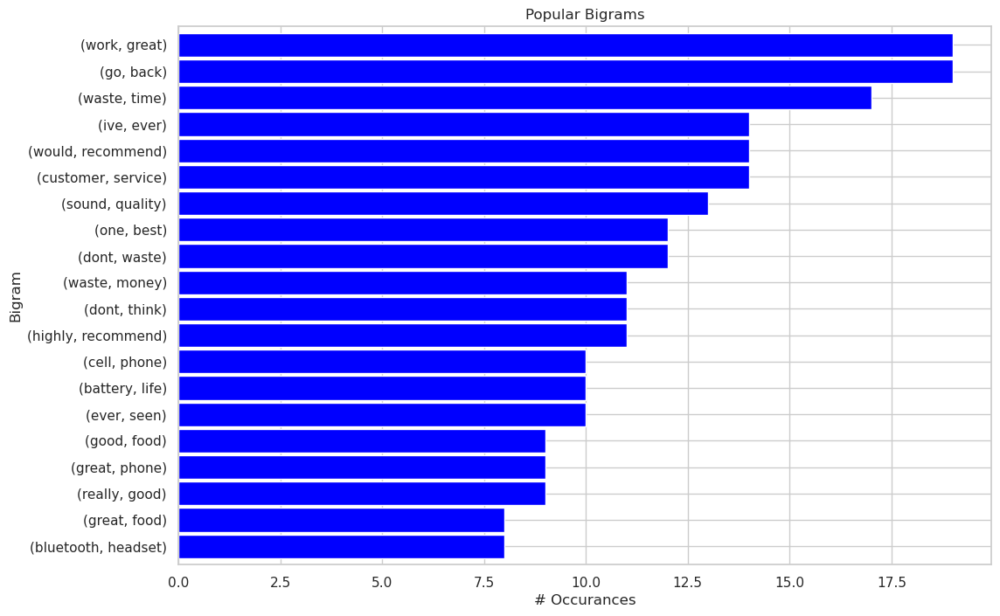

In [56]:
viz_bigrams(df, 'text', 'Popular Bigrams')

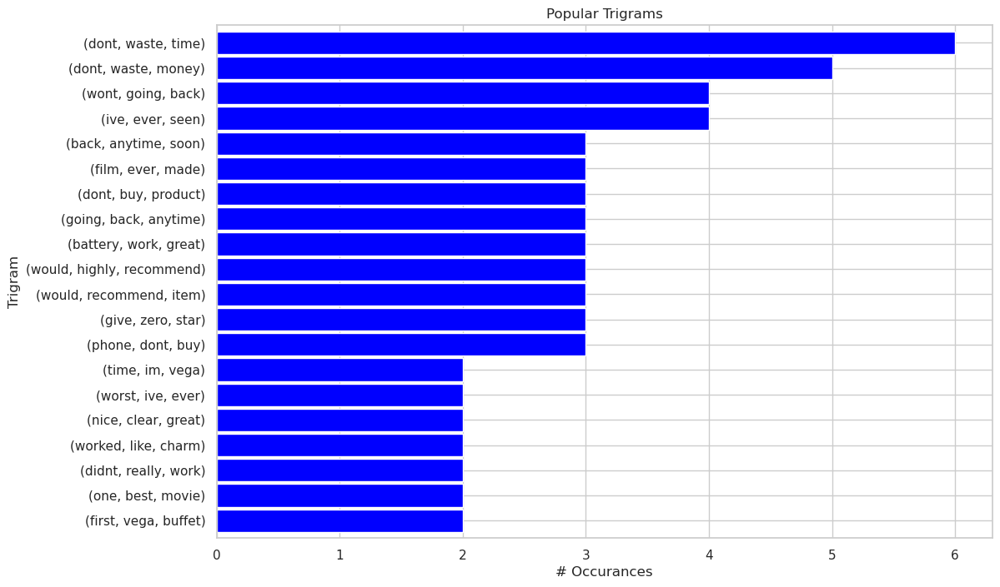

In [58]:
viz_trigrams(df, 'text', 'Popular Trigrams')

In [60]:
df.head()
df.tail()

,text,label
0,so there is no way for me to plug it in here in the us unless i go by a converter.,0
1,"good case, excellent value.",1
2,great for the jawbone.,1
3,tied to charger for conversations lasting more than 45 minutes.major problems!!,0
4,the mic is great.,1


,text,label
2743,i think food should have flavor and texture and both were lacking.,0
2744,appetite instantly gone.,0
2745,overall i was not impressed and would not go back.,0
2746,"the whole experience was underwhelming, and i think we'll just go to ninja sushi next time.",0
2747,"then, as if i hadn't wasted enough of my life there, they poured salt in the wound by drawing out the time it took to bring the check.",0


In [62]:
max_sequence_embedding = int(round(np.sqrt(np.sqrt(vocab_size)), 0))
print('Max sequence embedding: ' + str(max_sequence_embedding))

Max sequence embedding: 8


In [64]:
list_of_lens = []
for index, row in df.iterrows():
    list_of_lens.append(len(clean_sentence(row['text'])))
sequence_length = max(list_of_lens)
print('Sequence length: ' + str(sequence_length))

Sequence length: 789


In [66]:
mean_sequence_length = int(round(np.mean(list_of_lens), 0))
min_sequence_length = int(round(np.min(list_of_lens), 0))
median_sequence_length = int(round(np.median(list_of_lens), 0))

print('Mean sequence length: ' + str(mean_sequence_length))
print('Minimum sequence length: ' + str(min_sequence_length))
print('Median sequence length: ' + str(median_sequence_length))

Mean sequence length: 7
Minimum sequence length: 1
Median sequence length: 5


In [68]:
df['clean_text'] = df["text"].apply(clean_sentence)

In [70]:
df.head()

,text,label,clean_text
0,so there is no way for me to plug it in here in the us unless i go by a converter.,0,"[way, plug, u, unless, go, converter]"
1,"good case, excellent value.",1,"[good, case, excellent, value]"
2,great for the jawbone.,1,"[great, jawbone]"
3,tied to charger for conversations lasting more than 45 minutes.major problems!!,0,"[tied, charger, conversation, lasting, 45, minutesmajor, problem]"
4,the mic is great.,1,"[mic, great]"


In [72]:
def listToString(s): 
    
    #initialize an empty string 
    string = " "
    
    #return string 
    return (string.join(s))

In [74]:
df['clean2_text'] = df['clean_text'].apply(listToString)

In [76]:
df.head()

,text,label,clean_text,clean2_text
0,so there is no way for me to plug it in here in the us unless i go by a converter.,0,"[way, plug, u, unless, go, converter]",way plug u unless go converter
1,"good case, excellent value.",1,"[good, case, excellent, value]",good case excellent value
2,great for the jawbone.,1,"[great, jawbone]",great jawbone
3,tied to charger for conversations lasting more than 45 minutes.major problems!!,0,"[tied, charger, conversation, lasting, 45, minutesmajor, problem]",tied charger conversation lasting 45 minutesmajor problem
4,the mic is great.,1,"[mic, great]",mic great


**B. 2. Describe the goals of the tokenization process, including any code generated and packages used to normalize text during the tokenization process.** 

Here are the goals of the tokenization process used to normalize text before running and fitting our NLP model: 

Breaking text sentiment into "tokens" or short units. 

Standardize the text, ensuring no punctuation and that letters are lowercase, stemming, and lemmatization to keep the words consistent and reduce variability in each sentiment.  

Convert (map) the text into numeric terms. This is what is put into the NLP model, so we need to create a vocabulary of unique tokens from our dataset. 

Reduce model complexity by simplifying the sentiments and making it easier for the model to see the patterns. 

After the text has been normalized, it is time to split our dataset into testing and training. For this project, we split the dataset into testing and training sentences and testing and training labels.  

In [78]:
tokenizer = Tokenizer(oov_token="<OOV>")

In [80]:
split = round(len(df)*0.8)
train_reviews = df['clean2_text'][:split]
train_label = df['label'][:split]
test_reviews = df['clean2_text'][split:]
test_label = df['label'][split:]

#Saving training and testing dfs to CSV
train_reviews.to_csv('D213_Task2_trainreviews_JHOSEY.csv')
train_label.to_csv('D213_Task2_trainlabel_JHOSEY.csv')
test_reviews.to_csv('D213_Task2_testreviews_JHOSEY.csv')
test_label.to_csv('D213_Task2_testlabel_JHOSEY.csv')

In [82]:
train_reviews

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [84]:
test_label

2198    0
2199    1
2200    0
2201    0
2202    0
2203    0
2204    1
2205    1
2206    1
2207    1
2208    0
2209    1
2210    1
2211    0
2212    1
2213    1
2214    0
2215    0
2216    1
2217    1
2218    1
2219    0
2220    1
2221    0
2222    0
2223    0
2224    1
2225    1
2226    1
2227    1
2228    0
2229    1
2230    0
2231    0
2232    1
2233    1
2234    1
2235    0
2236    0
2237    1
2238    1
2239    1
2240    0
2241    1
2242    1
2243    0
2244    1
2245    1
2246    1
2247    1
2248    1
2249    0
2250    1
2251    1
2252    1
2253    0
2254    0
2255    0
2256    0
2257    0
2258    1
2259    1
2260    1
2261    1
2262    1
2263    1
2264    0
2265    1
2266    0
2267    1
2268    1
2269    1
2270    0
2271    0
2272    1
2273    0
2274    0
2275    1
2276    1
2277    1
2278    1
2279    1
2280    1
2281    1
2282    0
2283    1
2284    0
2285    1
2286    0
2287    1
2288    1
2289    0
2290    1
2291    0
2292    0
2293    1
2294    1
2295    0
2296    0
2297    1


In [86]:
training_sentences = []
training_labels = []
testing_sentences = []
testing_labels = []

for row in train_reviews:
    training_sentences.append(str(row))
for row in train_label:
    training_labels.append(row)
for row in test_reviews:
    testing_sentences.append(str(row))
for row in test_label:
    testing_labels.append(row)

In [88]:
testing_labels

[0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,


In [90]:
training_sentences

['way plug u unless go converter',
 'good case excellent value',
 'great jawbone',
 'tied charger conversation lasting 45 minutesmajor problem',
 'mic great',
 'jiggle plug get line right get decent volume',
 'several dozen several hundred contact imagine fun sending one one',
 'razr owneryou must',
 'needle say wasted money',
 'waste money time',
 'sound quality great',
 'impressed going original battery extended battery',
 'two seperated mere 5 ft started notice excessive static garbled sound headset',
 'good quality though',
 'design odd ear clip comfortable',
 'highly recommend one blue tooth phone',
 'advise everyone fooled',
 'far good',
 'work great',
 'click place way make wonder long mechanism would last',
 'went motorolas website followed direction could get pair',
 'bought use kindle fire absolutely loved',
 'commercial misleading',
 'yet run new battery two bar thats three day without charging',
 'bought mother problem battery',
 'great pocket pc phone combination',
 'ive o

**B. 3. Explain the padding process used to standardize the length of sequences. Include the following in your explanation: if the padding occurs before or after the text sequence** 

We used post-padding to standardize the length of the sequences. If the max length of a sentiment is 7 words, then all the sentiments with less than 7 words will have zeros added to ensure they have 7 numbers in the sentiment, even if some of the numbers code for no words (like '0').  

Code used: 

In [92]:
vocab_size = 4967
embedding_dim = 8
max_length = 7
trunc_type = 'post'
oov_tok = '<OOV>'
padding_type = 'post'

In [94]:
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)
word_index = tokenizer.word_index
print(word_index)

{'<OOV>': 1, 'movie': 2, 'film': 3, 'good': 4, 'phone': 5, 'great': 6, '0': 7, 'one': 8, '1': 9, 'like': 10, 'time': 11, 'work': 12, 'bad': 13, 'really': 14, 'well': 15, 'dont': 16, 'would': 17, 'place': 18, 'service': 19, 'best': 20, 'even': 21, 'ever': 22, 'quality': 23, 'character': 24, 'product': 25, 'also': 26, 'make': 27, 'food': 28, 'headset': 29, 'get': 30, 'love': 31, 'ive': 32, 'sound': 33, 'made': 34, 'use': 35, 'excellent': 36, 'battery': 37, 'could': 38, 'go': 39, 'better': 40, 'never': 41, 'thing': 42, 'recommend': 43, 'look': 44, 'im': 45, 'ear': 46, 'back': 47, 'acting': 48, 'see': 49, 'much': 50, 'way': 51, 'case': 52, 'first': 53, 'didnt': 54, 'think': 55, 'year': 56, 'nice': 57, 'price': 58, 'still': 59, 'scene': 60, 'worst': 61, 'story': 62, 'waste': 63, 'little': 64, '2': 65, 'every': 66, 'right': 67, 'people': 68, 'pretty': 69, 'everything': 70, 'got': 71, 'real': 72, 'problem': 73, 'say': 74, 'enough': 75, 'two': 76, 'doesnt': 77, 'know': 78, 'actor': 79, 'money'

In [96]:
sequences = tokenizer.texts_to_sequences(training_sentences)
padded = pad_sequences(sequences, maxlen=7, padding='post', truncating='post')
testing_sentences = tokenizer.texts_to_sequences(testing_sentences)
testing_padded = pad_sequences(testing_sentences, maxlen=max_length)

**a screenshot of a single padded sequence**

In [98]:
print(padded[1])

[  4  52  36 271   0   0   0]


**B. 4. Identify how many sentiment categories will be used and an activation function for the final dense layer of the network.** 

There are 2 sentiment categories ('0' and '1'); therefore, binary_crossentropy will be used with sigmoid for activation.

**B. 5. Explain the steps used to prepare the data for analysis, including the size of the training, validation, and test set split (based on the industry average).** 

- Load Dataset 
- Clean and preprocess the text: 
    - convert text to lowercase 
    - remove punctuation, special characters, and extra spaces 
    - remove stop words 
    - tokenize text into short sequences. 
- Split the dataset into training and testing; an 80-20 split was used for this project. 
- Tokenizing and sequencing text using a tokenizer 
- Converts words to numeric and creates a word_index 
- Padding the sequences to ensure each sentence is the same length; we chose to post-pad the sequences. 

**B. 6. Provide a copy of the prepared data set.** 

See the files attached in the task submission. 

In [100]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [171]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [104]:
model.build(input_shape=(None, max_length))

**Part III: Network Architecture** 

**C. 1. Provide the output of the model summary of the function from TensorFlow.** 

In [106]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 7, 8)           │        39,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 8)              │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │           900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,737 (178.66 KB)

 Trainable params: 45,737 (178.66 KB)

 Non-trainable params: 0 (0.00 B)

**C. 2. Discuss the number of layers, the type of layers, and the total number of parameters.** 

The model consists of 5 layers: an embedding layer, a global average pooling layer, a dense layer with 100 nodes, a dense layer with 50 nodes, and a dense layer with 1 node. The embedding layer maps sequences into dense vector representations at a fixed size. The global average pooling layer reduces the sequence dimension by averaging over the time steps. The dense layers with 100, 50, and 1 nodes are fully connected with the set number of nodes. The outputs for the dense layers will be at their set number of nodes (100, 50, and 1). Overall, the total number of parameters is 45737, the sum of all the trainable weights of the 5 different layers of the model. 

**C. 3. Justify the choice of hyperparameters, including the following elements:** 

**- activation functions** 
We used the ReLU (rectified linear unit) in the hidden layers; it promotes non-linearity. We used sigmoid activation for the output layer, which is excellent for our binary model. 

**- number of nodes per layer** 
Using three dense layers with 100, 50, and 1 nodes helps capture patterns from the dataset, reduce complexity and dimensionality, and clarify whether the outputs are a single value of '1' or '0'. 

**- loss function** 
Binary Crossentropy was used to measure the difference between predicted probabilities and the actual labels. 

**- optimizer** 
We used the Adam optimizer, which has an adaptive learning rate to ensure faster convergence and efficiency with gradient updates.  

**- stopping criteria** 
This will monitor validation loss and accuracy; the model stops training when its performance does not improve. This helps us from overfitting the model.  

**- evaluation metric** 
Accuracy is used as the evaluation metric; it measures the percentage of correct predictions the model makes.  

In [108]:
training_labels_final = np.array(training_labels)
testing_labels_final = np.array(testing_labels)

In [110]:
early_stopping_monitor = tf.keras.callbacks.EarlyStopping(patience=2)

**Part IV: Model Evaluation** 

**D. 1. Discuss the impact of using stopping criteria to define the number of epochs, including a screenshot showing the final training epoch.**

The results below show the model's early stopping monitor stopped at 4 epochs. This is used to control the model's performance and to prevent overfitting the model. If the model starts to overfit, it will begin to memorize the training data rather than predict the unseen data. Overfitting would result in a high training accuracy but low validation performance. In addition, using an early stopping monitor will be more time efficient if using a larger dataset, essentially saving time and computational resources. If we had not used the early stopping monitor, the model would have continued through the 20 epochs it was set to and would have provided poor validation results. 

**D. 2. Assess the fitness of the model and any actions taken to address overfitting.** 

- Training accuracy: 0.9451 
- Training loss: 0.1656 
- Validation accuracy: 0.7545 
- Validation loss: 0.5711 

The model performed well on training data with a high prediction accuracy of 94.51%. This demonstrates that the model could effectively learn the patterns in the training dataset. A low training loss indicates that the model makes very few prediction errors. A validation accuracy of 75.45% means that the model struggles to generalize well to new unseen data and is a sign of overfitting as the model fits well with the training data but fails to generalize on the validation (testing) data. A validation loss of 57.11% confirms that the model has overfitted the training data. This number should be close to the training loss value (16.56%) if overfitting did not occur.  

One method was used to stop overfitting the model, early stopping with a patience of 20 epochs. The model stopped at 4 epochs, which suggests that even though the training accuracy was improving, the validation (testing) performance was not improving. Early stopping monitoring is a good strategy to prevent overfitting and stop training the model as soon as the evaluation metrics decline.

In [112]:
num_epochs = 20
history = model.fit(padded, training_labels_final, epochs=num_epochs, 
            callbacks=[early_stopping_monitor], 
                    validation_data=(testing_padded, testing_labels_final))

Epoch 1/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5208 - loss: 0.6923 - val_accuracy: 0.6691 - val_loss: 0.6852
Epoch 2/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7260 - loss: 0.6526 - val_accuracy: 0.7109 - val_loss: 0.5495
Epoch 3/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8961 - loss: 0.3378 - val_accuracy: 0.7273 - val_loss: 0.5692
Epoch 4/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9451 - loss: 0.1656 - val_accuracy: 0.7545 - val_loss: 0.5711


**D. 3. Provide visualizations of the model's training process, including a line graph of the loss and chosen evaluation metric.**

Text(0.5, 1.0, 'Training and validation accuracy')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, 'Training and validation loss')

<Figure size 640x480 with 0 Axes>

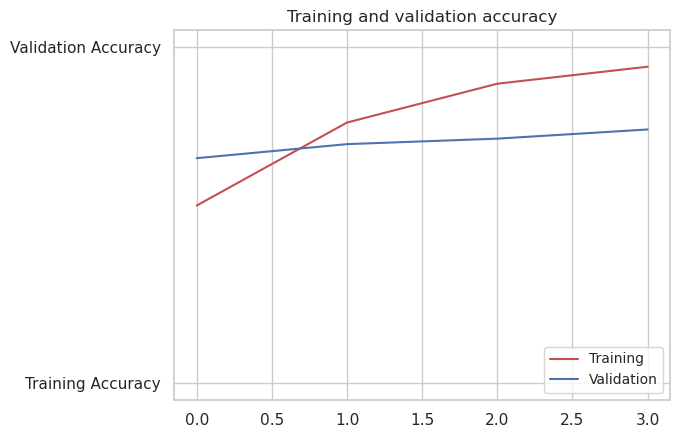

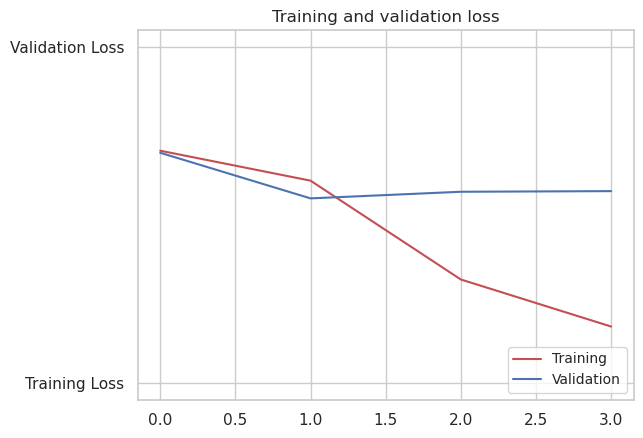

<Figure size 640x480 with 0 Axes>

In [114]:
import matplotlib.image as mpimg
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs=range(len(acc))
plt.plot(epochs, acc, 'r', 'Training Accuracy', label="Training")
plt.plot(epochs, val_acc, 'b', 'Validation Accuracy', label="Validation")
plt.legend(["Training", "Validation"], fontsize="small", loc="lower right")
plt.title('Training and validation accuracy')
plt.figure()
plt.plot(epochs, loss, 'r', 'Training Loss')
plt.plot(epochs, val_loss, 'b', 'Validation Loss')
plt.title('Training and validation loss')
plt.legend(["Training", "Validation"], fontsize="small", loc="lower right")
plt.figure()

**D. 4. Discuss the predictive accuracy of the trained network using the chosen evaluation metric from part D3.** 

Based on % training accuracy of 94.51%, the model correctly predicted above 90% of instances on the training dataset. Testing (validation) accuracy is at 75.45%, which means the model correctly predicted 75% of cases in the dataset. However, comparing validation and training accuracy, we see that both numbers are pretty high. This may indicate that the model is overfitting and is memorizing the training data.

**Part V: Summary and Recommendations** 

**E. Provide the code you used to save the trained network within the neural network.** 

See the files attached in the task submission. 

**F. Discuss your neural network's functionality, including the impact of the network architecture.** 

The architecture of our model is stated above in part C3. Changing the number of layers may help the model validate (testing) data better. 

As for the functionality of the network, it has some promising features, such as relatively high training accuracy. However, the validation accuracy is also high, which suggests that the model is overfitting and is memorizing the training data rather than predicting from unseen data sources. More data must be added to see if this changes the model's results.  

**G. Recommend a course of action based on your results.** 

There are a few actions we can take based on the results of the model. First, we can increase the amount of data provided. This dataset was only 10,000 rows; this is not a large dataset, which can lead the model to overfit. Another action could be simplifying the model by reducing the number of layers within the model. Simplifying the model will help it generalize to unseen data better, especially with a small dataset. Ultimately, adding more data to the model should help increase the prediction capabilities of testing data.

**Part VI: Reporting** 

**H. Show your neural network in an industry-relevant interactive development environment. Include a PDF or HTML document of your executed notebook presentation.** 

See the files attached in the task submission. 

**I. Sources** 

Aubergine Solutions. (2019, October 2). Scratching surface of RNN, GRU, and LSTM with example of sentiment analysis. Medium. Retrieved January 19, 2025, from https://medium.com/aubergine-solutions/scratching-surface-of-rnn-gru-and-lstm-with-example-of-sentiment-analysis-8dd4e748d426  

Brownlee, J. (2018, August 17). How to configure the number of layers and nodes in a neural network. Machine Learning Mastery. Retrieved January 19, 2025, from https://machinelearningmastery.com/how-to-configure-the-number-of-layers-and-nodes-in-a-neural-network/  

Brownlee, J. (2020, August 20). A Gentle Introduction to the Rectified Linear Unit (ReLU). Machine Learning Mastery. https://machinelearningmastery.com/rectified-linear-activation-function-for-deep-learning-neural-networks/  

Built In. (n.d.). ReLU activation function. Retrieved January 19, 2025, from https://builtin.com/machine-learning/relu-activation-function  

GeeksforGeeks. (n.d.). Adam optimizer in TensorFlow. Retrieved January 19, 2025, from https://www.geeksforgeeks.org/adam-optimizer-in-tensorflow/  

Kingma, D., and Ba, J. (2017, January 30). Adam: A method of stochastic optimization. Retrieved January 19th, 2025, from https://arxiv.org/abs/1412.6280 

Sharma, A. (2019, July 30). A complete step-by-step tutorial on sentiment analysis in Keras and TensorFlow. Towards Data Science. Retrieved January 19, 2025, from https://towardsdatascience.com/a-complete-step-by-step-tutorial-on-sentiment-analysis-in-keras-and-tensorflow-ea420cc8913f 

Stack Overflow. (n.d.). Detect strings with non-English characters in Python. Retrieved January 19, 2025, from https://stackoverflow.com/questions/27084617/detect-strings-with-non-english-characters-in-python 

Team, K. (2020). Keras documentation: The Sequential model. K. Team. https://keras.io/guides/sequential_model/  

UCI Machine Learning Repository. (n.d.). Sentiment labelled sentences. Retrieved January 19, 2025, from https://archive.ics.uci.edu/dataset/331/sentiment+labelled+sentences 